In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
url = 'https://raw.githubusercontent.com/amankharwal/Website-data/master/database.csv'
df1= pd.read_csv(url)
df1.columns

Index(['Date', 'Time', 'Latitude', 'Longitude', 'Type', 'Depth', 'Depth Error',
       'Depth Seismic Stations', 'Magnitude', 'Magnitude Type',
       'Magnitude Error', 'Magnitude Seismic Stations', 'Azimuthal Gap',
       'Horizontal Distance', 'Horizontal Error', 'Root Mean Square', 'ID',
       'Source', 'Location Source', 'Magnitude Source', 'Status'],
      dtype='object')

In [4]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df1)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df1 = df1[['Date', 'Time', 'Latitude', 'Longitude', 'Depth', 'Magnitude']]

In [5]:
import datetime
import time


epoch = datetime.datetime(1970, 1, 1)

def mapdateTotime(x):
    try:
        dt = datetime.datetime.strptime(x, "%m/%d/%Y")
    except ValueError:
        dt = datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S.%fZ")
    diff = dt - epoch
    return diff.total_seconds()

df1.Date = df1.Date.apply(mapdateTotime)
df1.head()

,Date,Time,Latitude,Longitude,Depth,Magnitude
0,-157680000.0,13:44:18,19.246,145.616,131.6,6.0
1,-157507200.0,11:29:49,1.863,127.352,80.0,5.8
2,-157420800.0,18:05:58,-20.579,-173.972,20.0,6.2
3,-157161600.0,18:49:43,-59.076,-23.557,15.0,5.8
4,-157075200.0,13:32:50,11.938,126.427,15.0,5.8


In [ ]:
!pip install matplotlib
!apt install libproj-dev libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/v1.2.0rel.tar.gz
!pip install pyproj==1.9.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
libproj-dev is already the newest version (4.9.3-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 22 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/matplotlib/basemap/archive/v1.2.0rel.tar.gz
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


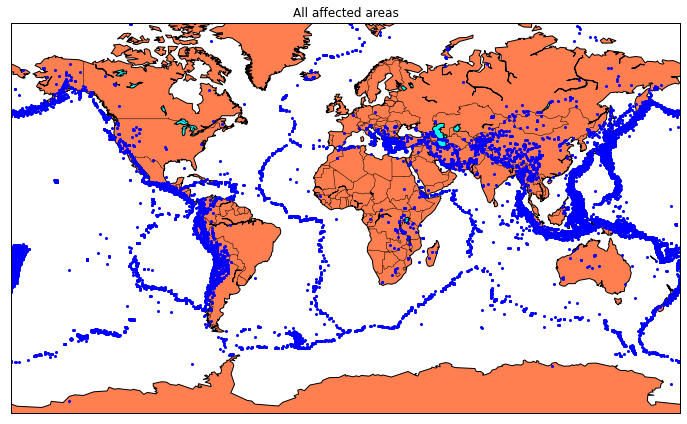

In [ ]:
from mpl_toolkits.basemap import Basemap

m = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')

longitudes = df1["Longitude"].tolist()
latitudes = df1["Latitude"].tolist()
#m = Basemap(width=12000000,height=9000000,projection='lcc',
            #resolution=None,lat_1=80.,lat_2=55,lat_0=80,lon_0=-107.)
x,y = m(longitudes,latitudes)

fig = plt.figure(figsize=(12,10))
plt.title("All affected areas")
m.plot(x, y, "o", markersize = 2, color = 'blue')
m.drawcoastlines()
m.fillcontinents(color='coral',lake_color='aqua')
m.drawmapboundary()
m.drawcountries()
plt.show()

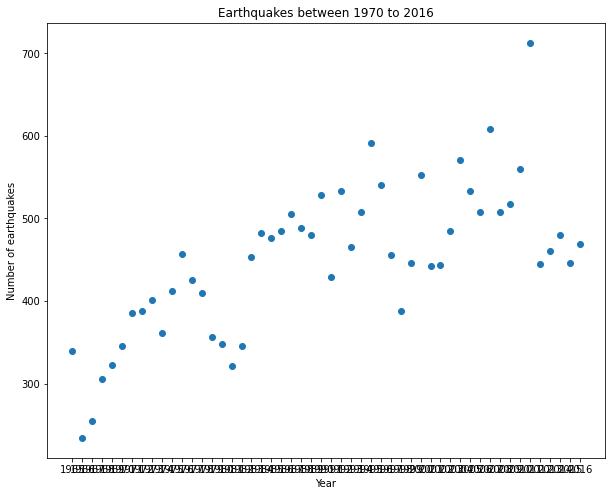

In [ ]:
data= pd.read_csv(url)

data['date']=data['Date'].apply(lambda x: pd.to_datetime(x))
data['year']=data['date'].apply(lambda x:str(x).split('-')[0])
x=data['year'].unique()
y=data['year'].value_counts()
count=[]
for i in range(len(x)):
    count.append(y[x[i]])

plt.figure(figsize=(10,8))    
plt.scatter(x,count)
plt.xlabel('Year')
plt.ylabel('Number of earthquakes')
plt.title('Earthquakes between 1970 to 2016')
plt.show()

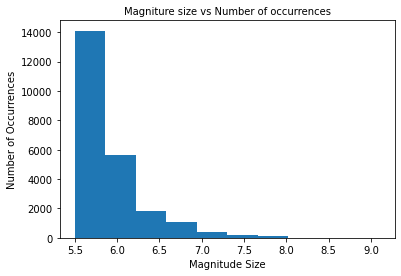

In [ ]:
plt.hist(data['Magnitude'])
plt.xlabel('Magnitude Size')
plt.ylabel('Number of Occurrences')
plt.title('Magniture size vs Number of occurrences', fontweight = 20, fontsize = 10)
plt.show()

In [6]:

col1 = df1[['Date','Latitude','Longitude','Depth']]
col2 = df1['Magnitude']

InputX1 = col1.to_numpy()
InputY1 = col2.to_numpy()
print(InputX1)



[[-1.5768000e+08  1.9246000e+01  1.4561600e+02  1.3160000e+02]
 [-1.5750720e+08  1.8630000e+00  1.2735200e+02  8.0000000e+01]
 [-1.5742080e+08 -2.0579000e+01 -1.7397200e+02  2.0000000e+01]
 ...
 [ 1.4828832e+09  3.6917900e+01  1.4042620e+02  1.0000000e+01]
 [ 1.4829696e+09 -9.0283000e+00  1.1866390e+02  7.9000000e+01]
 [ 1.4830560e+09  3.7397300e+01  1.4141030e+02  1.1940000e+01]]


In [7]:
X1_min = np.amin(InputX1,0)     
X1_max = np.amax(InputX1,0)   
print("Mininum values:",X1_min)
print("Maximum values:",X1_max)
Y1_min = np.amin(InputY1)     
Y1_max = np.amax(InputY1) 
InputX1_norm = (InputX1-X1_min)/(X1_max-X1_min)
InputY1_norm = InputY1 


Xfeatures = 3 
Yfeatures = 1 
samples = 23000

InputX1_reshape = np.resize(InputX1_norm,(samples,Xfeatures))
InputY1_reshape = np.resize(InputY1_norm,(samples,Yfeatures))



Mininum values: [-1.57680e+08 -7.70800e+01 -1.79997e+02 -1.10000e+00]
Maximum values: [1.483056e+09 8.600500e+01 1.799980e+02 7.000000e+02]


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(InputX1_reshape, InputY1_reshape, test_size=0.2, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, X_test.shape)

(18400, 3) (4600, 3) (18400, 1) (4600, 3)


In [ ]:
from sklearn.ensemble import RandomForestRegressor

reg = RandomForestRegressor(random_state=42)
reg.fit(X_train, y_train)
reg.predict(X_test)

array([[  5.865,  42.024],
       [  5.826,  33.09 ],
       [  6.082,  39.741],
       ...,
       [  6.306,  23.059],
       [  5.96 , 592.283],
       [  5.808,  38.222]])

In [ ]:
reg.score(X_test,y_test)

0.3926671400442392

In [ ]:
from sklearn.model_selection import GridSearchCV

parameters = {'n_estimators':[10, 20, 50, 100, 200, 500]}

grid_obj = GridSearchCV(reg, parameters)
grid_fit = grid_obj.fit(X_train, y_train)
best_fit = grid_fit.best_estimator_
best_fit.predict(X_test)

array([[  5.886 ,  43.031 ],
       [  5.82  ,  31.3982],
       [  6.0124,  39.5216],
       ...,
       [  6.294 ,  22.9908],
       [  5.9218, 592.385 ],
       [  5.7894,  39.2764]])

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

model1 = LinearRegression()
model1.fit(X_train, y_train)

ypred1= model1.predict(X_test)

print("Mean Squared error: ", mean_squared_error(y_test, ypred1))
print("Mean Absolute error: ", mean_absolute_error(y_test, ypred1))

Mean Squared error:  0.18101538768051612
Mean Absolute error:  0.3139701924762079


In [ ]:
#Training data
batch_size = 2000
InputX1train = InputX1_reshape[0:batch_size,:]
InputY1train = InputY1_reshape[0:batch_size,:]
#Validation data
v_size = 2500
InputX1v = InputX1_reshape[batch_size:batch_size+v_size,:]
InputY1v = InputY1_reshape[batch_size:batch_size+v_size,:]

In [ ]:

learning_rate = 0.001
training_iterations = 1000
display_iterations = 200



In [ ]:

#Input
X = tf.placeholder(tf.float32,shape=(None,Xfeatures))
#Output
Y = tf.placeholder(tf.float32)

In [ ]:


#Neurons
L1 = 3
L2 = 3
L3 = 3

#Layer1 weights
W_fc1 = tf.Variable(tf.random_uniform([Xfeatures,L1]))
b_fc1 = tf.Variable(tf.constant(0.1,shape=[L1]))

#Layer2 weights
W_fc2 = tf.Variable(tf.random_uniform([L1,L2]))
b_fc2 = tf.Variable(tf.constant(0.1,shape=[L2]))

#Layer3 weights
W_fc3 = tf.Variable(tf.random_uniform([L2,L3]))
b_fc3 = tf.Variable(tf.constant(0.1,shape=[L3]))

#Output layer weights
W_fO= tf.Variable(tf.random_uniform([L3,Yfeatures]))
b_fO = tf.Variable(tf.constant(0.1,shape=[Yfeatures]))



In [ ]:


#Layer 1
matmul_fc1=tf.matmul(X, W_fc1) + b_fc1
h_fc1 = tf.nn.relu(matmul_fc1)   #ReLU activation
#Layer 2
matmul_fc2=tf.matmul(h_fc1, W_fc2) + b_fc2
h_fc2 = tf.nn.relu(matmul_fc2)   #ReLU activation
#Layer 3
matmul_fc3=tf.matmul(h_fc2, W_fc3) + b_fc3
h_fc3 = tf.nn.relu(matmul_fc3)   #ReLU activation
#Output layer
matmul_fc4=tf.matmul(h_fc3, W_fO) + b_fO
output_layer = matmul_fc4  #linear activation

In [ ]:


#Loss function
mean_square =  tf.reduce_mean(tf.square(Y-output_layer))
train_step = tf.train.AdamOptimizer(learning_rate).minimize(mean_square)

#Operation to save variables
saver = tf.train.Saver()



In [ ]:


#Initialization and session
init = tf.global_variables_initializer()
with tf.Session() as sess:
    sess.run(init)
    print("Training loss:",sess.run([mean_square],feed_dict={X:InputX1train,Y:InputY1train}))
    for i in range(training_iterations):
        sess.run([train_step],feed_dict={X:InputX1train,Y:InputY1train})
        if i%display_iterations ==0:
            print("Training loss is:",sess.run([mean_square],feed_dict={X:InputX1train,Y:InputY1train}),"at itertion:",i)
            print("Validation loss is:",sess.run([mean_square],feed_dict={X:InputX1v,Y:InputY1v}),"at itertion:",i)
    # Save the variables to disk.
    save_path = saver.save(sess, "/tmp/earthquake_model.ckpt")
    print("Model saved in file: %s" % save_path)

    print("Final training loss:",sess.run([mean_square],feed_dict={X:InputX1train,Y:InputY1train}))
    print("Final validation loss:",sess.run([mean_square],feed_dict={X:InputX1v,Y:InputY1v}))



Training loss: [13.607166]
Training loss is: [13.43739] at itertion: 0
Validation loss is: [11.887166] at itertion: 0
Training loss is: [2.162265] at itertion: 200
Validation loss is: [1.9591688] at itertion: 200
Training loss is: [1.4575295] at itertion: 400
Validation loss is: [1.3913368] at itertion: 400
Training loss is: [1.0248038] at itertion: 600
Validation loss is: [1.0192969] at itertion: 600
Training loss is: [0.7404771] at itertion: 800
Validation loss is: [0.7567452] at itertion: 800
Model saved in file: /tmp/earthquake_model.ckpt
Final training loss: [0.54313505]
Final validation loss: [0.5636591]


In [ ]:
#Testing
lat = input("Enter Latitude between -77 to 86:")
long = input("Enter Longitude between -180 to 180:")
depth = input("Enter Depth between 0 to 700:")
date = input("Enter the date (Month/Day/Year format):")
InputX2 = np.asarray([[lat,long,depth,mapdateTotime(date)]],dtype=np.float32)
InputX2_norm = (InputX2-X1_min)/(X1_max-X1_min)
InputX1test = np.resize(InputX2_norm,(1,Xfeatures))
with tf.Session() as sess:
    # Restore variables from disk for validation.
    saver.restore(sess, "/tmp/earthquake_model.ckpt")
    print("Model restored.")
    #print("Final validation loss:",sess.run([mean_square],feed_dict={X:InputX1v,Y:InputY1v}))
    print("output:",sess.run([output_layer],feed_dict={X:InputX1test}))

Enter Latitude between -77 to 86:74
Enter Longitude between -180 to 180:98
Enter Depth between 0 to 700:56
Enter the date (Month/Day/Year format):10/10/2010
Model restored.
output: [array([[6.3653684]], dtype=float32)]
